## SVO and Modifier grouped analysis over Finetuned NLI models

- Author: Sushma Akoju, email: sushmaakoju@arizona.edu

In [ ]:
# !pip install openpyxl --upgrade

In [2]:
!pip install pycm==3.7
!pip install altair==5.0.0rc1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


In [4]:
import pandas as pd
import pycm
import matplotlib.pyplot as plt
import os
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, classification_report
import altair as alt


### Connect to the Google drive
- for finetuned NLI models evlaution

In [5]:
import os
path = "/content/drive/MyDrive/Colab Notebooks/natural-logic/final-datasets/block-wise-data/blocks-dec26/annotated/combined/results/zero-shot"
# output_path = "/content/drive/MyDrive/Colab Notebooks/natural-logic/final-datasets/block-wise-data/blocks-dec26/annotated/combined/results/fine-tuned-results"
assert os.path.exists(path), "Error"
df = pd.read_excel(os.path.join(path,"zero-shot-analysis-apr24.xlsx"))
#zero-shot-analysis-apr24.xlsx
df = df[df.columns[1:]]
df = df[['SICK_id', 'Premise', 'Hypothesis', 'Modifier',
       'Premise/Hypothesis/Both', 'Part of Premise/Hypothesis Modified',
       'Modifier Type', 'Ground Truth',  'CompressedGT','nli-deberta-v3-base',
       'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli',
       'pair-classification-decomposable-attention-elmo']]
df['Part of Premise/Hypothesis Modified'] = df['Part of Premise/Hypothesis Modified'].str.lower()
df['Modifier Type'] = df['Modifier Type'].str.lower()

print(df.columns)
df.head()

Index(['SICK_id', 'Premise', 'Hypothesis', 'Modifier',
       'Premise/Hypothesis/Both', 'Part of Premise/Hypothesis Modified',
       'Modifier Type', 'Ground Truth', 'CompressedGT', 'nli-deberta-v3-base',
       'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli',
       'pair-classification-decomposable-attention-elmo'],
      dtype='object')


,SICK_id,Premise,Hypothesis,Modifier,Premise/Hypothesis/Both,Part of Premise/Hypothesis Modified,Modifier Type,Ground Truth,CompressedGT,nli-deberta-v3-base,ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli,pair-classification-decomposable-attention-elmo
0,90,a man is jumping into an empty pool,a man is jumping into a full pool,NONE,NONE,none,no modifiers,Alternation,Contradiction,Contradiction,Contradiction,FE
1,90,every man is jumping into an empty pool,a man is jumping into a full pool,every,Premise,subject,universal,Alternation,Contradiction,Contradiction,Contradiction,FE
2,90,a man is jumping into an empty pool,every man is jumping into a full pool,every,Hypothesis,subject,universal,Negation,Contradiction,Contradiction,Contradiction,FE
3,90,every man is jumping into an empty pool,every man is jumping into a full pool,every,Both,subject,universal,Negation,Contradiction,Contradiction,Contradiction,FE
4,90,some man is jumping into an empty pool,a man is jumping into a full pool,some,Premise,subject,existential,Alternation,Contradiction,Contradiction,Contradiction,FE


In [6]:
modifier_types = df['Modifier Type'].unique()

In [8]:
def get_classification_report(ytrue, ypred, model_name, mtype="", svo=""):
  res = classification_report(ytrue, ypred, output_dict=True)
  print(classification_report(ytrue, ypred))
  precision_m = res['macro avg']['precision']
  recall_m = res['macro avg']['recall']
  f1_macro = res['macro avg']['f1-score']
  acc = res['accuracy']
  return {"model_name":model_name, "modifier_type":mtype,"svo": svo,
          "f1_macro":f1_macro, "precision_m":precision_m, "recall_m":recall_m, "acc":acc}

### Fine tuned Five-fold NLI models evaluation and analysis
#### For 2 NLI models:
- 'nli-deberta-v3-base',
- 'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli'

In [19]:
gt = 'CompressedGT'
pred = 'pred_labels'
svo = "Part of Premise/Hypothesis Modified"
mod_type_col = 'Modifier Type'

In [ ]:
output_path = "/content/drive/MyDrive/Colab Notebooks/natural-logic/june12"
model_folders = ["nli-deberta-v3-base", "roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli"]
files = []
files = [os.path.join(os.path.join(output_path, model_folders[0]), file) for file in os.listdir(os.path.join(output_path,model_folders[0])) ]
temp = [os.path.join(os.path.join(output_path, model_folders[1]), file) for file in os.listdir(os.path.join(output_path,model_folders[1])) ]
files.extend(temp)
for file in files:
  #print(file)
  df = pd.read_csv(file)

  df[pred] = df[pred].replace("Negation", "Contradiction")
  #print( "Negation" in df[pred].unique())
  # print(len(df[svo].unique())>3, len(df[mod_type_col].unique())>5, len(df[gt].unique())>4, len(df[pred].unique())>4)

In [14]:
assert len(files) == 60, "not all Evaluation files included!"

#### SVO-grouped scores for each of the five folds: F1, precision, recall and accuracy:

In [34]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
model_names = ['nli-deberta-v3-base',
       'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli']

finetuned_models_svo_scores = []
for file in files:
  model_name = ""
  if "deberta" in os.path.basename(file):
    model_name = model_names[0]
  if "roberta" in os.path.basename(file):
    model_name = model_names[1]

  #print(files)
  print(file)

  df = pd.read_csv(file)
  epochs, batch_size, fold = file[-20:].split("_")[1:4]
  print(model_name,epochs, batch_size, fold )
  df[pred] = df[pred].replace("Negation", "Contradiction")
  df[svo] = df[svo].str.lower().str.strip()
  for svo_type in df[svo].unique():
    print("The scores are for SVO %s, model name %s"%( svo_type,model_name))
    ytrue = df[df[svo] == svo_type][gt].to_list()
    ypred = df[df[svo] == svo_type][pred].to_list()
    res = get_classification_report(ytrue, ypred, model_name,"", svo_type)
    res["num_epochs"] = epochs
    res["batch_size"] = batch_size
    res["fold"] = fold
    finetuned_models_svo_scores.append(res)

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_0_test.xlsx
nli-deberta-v3-base 4 8 0
The scores are for SVO none, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         1
           FE       0.00      0.00      0.00         0
      Neutral       1.00      0.50      0.67         2

     accuracy                           0.67         3
    macro avg       0.67      0.50      0.56         3
 weighted avg       1.00      0.67      0.78         3

The scores are for SVO subject, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.90      0.77      0.83        35
           FE       0.00      0.00      0.00         0
      Neutral       1.00      0.10      0.18        82
           RE       0.00      0.00      0.00         0

     accuracy                           0.30       117
    macro 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.97      0.97      0.97        31
           FE       0.00      0.00      0.00         0
      Neutral       1.00      0.08      0.14        65
           RE       0.00      0.00      0.00         0

     accuracy                           0.36        96
    macro avg       0.49      0.26      0.28        96
 weighted avg       0.99      0.36      0.41        96

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_1_test.xlsx
nli-deberta-v3-base 4 8 1
The scores are for SVO object, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.98      0.84      0.90        49
           FE       0.06      0.08      0.06        26
      Neutral       0.00      0.00      0.00        24
           RE       0.00      0.00      0.00         3

     accuracy                           0.42       102
    macro avg   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

               precision    recall  f1-score   support

Contradiction       0.92      0.76      0.83        29
           FE       0.06      0.04      0.05        46
      Neutral       0.19      0.23      0.21        35
           RE       0.00      0.00      0.00         4

     accuracy                           0.28       114
    macro avg       0.29      0.26      0.27       114
 weighted avg       0.32      0.28      0.30       114

The scores are for SVO verb, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.92      0.85      0.88        13
           FE       0.07      0.09      0.08        11
      Neutral       0.33      0.21      0.26        19
           RE       0.17      0.50      0.25         2

     accuracy                           0.38        45
    macro avg       0.37      0.41      0.37        45
 weighted avg       0.43      0.38      0.39        45

/content/drive/MyDrive/Colab Notebooks/natural-logic/j

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

               precision    recall  f1-score   support

Contradiction       0.75      0.90      0.82        52
           FE       0.07      0.08      0.08        25
      Neutral       0.00      0.00      0.00        38
           RE       0.05      1.00      0.10         1

     accuracy                           0.43       116
    macro avg       0.22      0.50      0.25       116
 weighted avg       0.35      0.43      0.38       116

The scores are for SVO verb, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.75      0.90      0.82        20
           FE       0.13      0.33      0.19         6
      Neutral       0.00      0.00      0.00        17
           RE       0.40      1.00      0.57         2

     accuracy                           0.49        45
    macro avg       0.32      0.56      0.40        45
 weighted avg       0.37      0.49      0.41        45

/content/drive/MyDrive/Colab Notebooks/natural-logic/j

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif


The scores are for SVO verb, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.00      0.00      0.00         1
           FE       0.18      1.00      0.30         7
      Neutral       1.00      0.05      0.10        37
           RE       0.00      0.00      0.00         0

     accuracy                           0.20        45
    macro avg       0.29      0.26      0.10        45
 weighted avg       0.85      0.20      0.13        45

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_16_0_test.xlsx
nli-deberta-v3-base 4 16 0
The scores are for SVO none, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         1
           FE       0.00      0.00      0.00         0
      Neutral       1.00      0.50      0.67         2

     accuracy                           0.67         3
    macro 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.89      0.89      0.89         9
           FE       0.00      0.00      0.00         0
      Neutral       1.00      0.14      0.24        36
           RE       0.00      0.00      0.00         0

     accuracy                           0.29        45
    macro avg       0.47      0.26      0.28        45
 weighted avg       0.98      0.29      0.37        45

The scores are for SVO object, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.96      0.71      0.81        31
           FE       0.00      0.00      0.00         0
      Neutral       1.00      0.26      0.41        65
           RE       0.00      0.00      0.00         0

     accuracy                           0.41        96
    macro avg       0.49      0.24      0.31        96
 weighted avg       0.99      0.41      0.54        96

/content/drive/MyDrive/Colab Notebooks/natural-logic

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

               precision    recall  f1-score   support

Contradiction       0.98      0.82      0.89        66
           FE       0.37      0.83      0.51        23
      Neutral       0.25      0.10      0.14        20
           RE       0.00      0.00      0.00         7

     accuracy                           0.65       116
    macro avg       0.40      0.44      0.39       116
 weighted avg       0.67      0.65      0.63       116

The scores are for SVO verb, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.94      0.70      0.80        23
           FE       0.43      1.00      0.61        10
      Neutral       0.00      0.00      0.00         6
           RE       0.00      0.00      0.00         1

     accuracy                           0.65        40
    macro avg       0.34      0.42      0.35        40
 weighted avg       0.65      0.65      0.61        40

/content/drive/MyDrive/Colab Notebooks/natural-logic/j

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

               precision    recall  f1-score   support

Contradiction       0.86      0.83      0.84        29
           FE       0.24      0.20      0.21        46
      Neutral       0.15      0.17      0.16        35
           RE       0.00      0.00      0.00         4

     accuracy                           0.34       114
    macro avg       0.31      0.30      0.30       114
 weighted avg       0.36      0.34      0.35       114

The scores are for SVO verb, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.87      1.00      0.93        13
           FE       0.18      0.18      0.18        11
      Neutral       0.38      0.32      0.34        19
           RE       0.00      0.00      0.00         2

     accuracy                           0.47        45
    macro avg       0.36      0.37      0.36        45
 weighted avg       0.45      0.47      0.46        45

/content/drive/MyDrive/Colab Notebooks/natural-logic/j

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

nli-deberta-v3-base 4 16 4
The scores are for SVO object, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.64      1.00      0.78         7
           FE       0.29      1.00      0.44        24
      Neutral       1.00      0.18      0.30        84
           RE       0.00      0.00      0.00         0

     accuracy                           0.40       115
    macro avg       0.48      0.54      0.38       115
 weighted avg       0.83      0.40      0.36       115

The scores are for SVO none, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         1
           FE       0.33      1.00      0.50         1
      Neutral       0.00      0.00      0.00         2

     accuracy                           0.50         4
    macro avg       0.44      0.67      0.50         4
 weighted avg       0.33      0.50      0.38         4

The scores are for S

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

               precision    recall  f1-score   support

Contradiction       0.00      0.00      0.00         1
           FE       0.17      1.00      0.30         7
      Neutral       1.00      0.03      0.05        37

     accuracy                           0.18        45
    macro avg       0.39      0.34      0.12        45
 weighted avg       0.85      0.18      0.09        45

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_32_0_test.xlsx
nli-deberta-v3-base 4 32 0
The scores are for SVO none, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         1
           FE       0.00      0.00      0.00         0
      Neutral       1.00      0.50      0.67         2

     accuracy                           0.67         3
    macro avg       0.67      0.50      0.56         3
 weighted avg       1.00      0.67      0.78         3

The scores are 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.93      0.87      0.90        31
           FE       0.00      0.00      0.00         0
      Neutral       1.00      0.22      0.35        65
           RE       0.00      0.00      0.00         0

     accuracy                           0.43        96
    macro avg       0.48      0.27      0.31        96
 weighted avg       0.98      0.43      0.53        96

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_32_1_test.xlsx
nli-deberta-v3-base 4 32 1
The scores are for SVO object, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.96      0.98      0.97        49
           FE       0.53      1.00      0.69        26
      Neutral       1.00      0.12      0.22        24
           RE       0.00      0.00      0.00         3

     accuracy                           0.75       102
    macro avg 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


nli-deberta-v3-base 4 32 2
The scores are for SVO object, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.97      0.81      0.88        47
           FE       0.28      0.36      0.31        28
      Neutral       0.12      0.10      0.11        20
           RE       0.00      0.00      0.00         4

     accuracy                           0.51        99
    macro avg       0.34      0.32      0.33        99
 weighted avg       0.57      0.51      0.53        99

The scores are for SVO none, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         1
           FE       0.00      0.00      0.00         2
      Neutral       0.00      0.00      0.00         0

     accuracy                           0.33         3
    macro avg       0.33      0.33      0.33         3
 weighted avg       0.33      0.33      0.33         3

The scores are for S

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

               precision    recall  f1-score   support

Contradiction       1.00      0.69      0.82        13
           FE       0.15      0.27      0.19        11
      Neutral       0.22      0.11      0.14        19
           RE       0.14      0.50      0.22         2

     accuracy                           0.33        45
    macro avg       0.38      0.39      0.34        45
 weighted avg       0.43      0.33      0.35        45

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_32_3_test.xlsx
nli-deberta-v3-base 4 32 3
The scores are for SVO object, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.86      0.94      0.90        34
           FE       0.30      0.19      0.24        36
      Neutral       0.29      0.25      0.27        24
           RE       0.00      0.00      0.00         3

     accuracy                           0.46        97
    macro avg 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         1
           FE       0.00      0.00      0.00         1
      Neutral       0.00      0.00      0.00         2

     accuracy                           0.25         4
    macro avg       0.33      0.33      0.33         4
 weighted avg       0.25      0.25      0.25         4

The scores are for SVO subject, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.00      0.00      0.00         0
           FE       0.07      0.50      0.12        12
      Neutral       0.17      0.01      0.02        82
           RE       0.00      0.00      0.00         3

     accuracy                           0.07        97
    macro avg       0.06      0.13      0.04        97
 weighted avg       0.15      0.07      0.03        97

The scores are for SVO verb, model name nli-deberta-v3-base
               precision    recall  f1-score  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.98      0.94      0.96        49
           FE       0.07      0.08      0.07        26
      Neutral       0.06      0.04      0.05        24
           RE       0.00      0.00      0.00         3

     accuracy                           0.48       102
    macro avg       0.28      0.26      0.27       102
 weighted avg       0.50      0.48      0.49       102

The scores are for SVO none, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         2
           FE       0.00      0.00      0.00         1
      Neutral       0.00      0.00      0.00         0

     accuracy                           0.67         3
    macro avg       0.33      0.33      0.33         3
 weighted avg       0.67      0.67      0.67         3

The scores are for SVO subject, model name nli-deberta-v3-base
               precision    recall  f1-score  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

               precision    recall  f1-score   support

Contradiction       0.87      0.97      0.92        34
           FE       0.26      0.14      0.18        36
      Neutral       0.35      0.25      0.29        24
           RE       0.09      0.67      0.15         3

     accuracy                           0.47        97
    macro avg       0.39      0.51      0.39        97
 weighted avg       0.49      0.47      0.47        97

The scores are for SVO none, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         2
           FE       0.00      0.00      0.00         1
           RE       0.00      0.00      0.00         0

     accuracy                           0.67         3
    macro avg       0.33      0.33      0.33         3
 weighted avg       0.67      0.67      0.67         3

The scores are for SVO subject, model name nli-deberta-v3-base
               precision    recall  f1-score  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

               precision    recall  f1-score   support

Contradiction       0.89      0.89      0.89         9
           FE       0.00      0.00      0.00         0
      Neutral       1.00      0.08      0.15        36
           RE       0.00      0.00      0.00         0

     accuracy                           0.24        45
    macro avg       0.47      0.24      0.26        45
 weighted avg       0.98      0.24      0.30        45

The scores are for SVO object, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       0.97      0.90      0.93        31
           FE       0.00      0.00      0.00         0
      Neutral       1.00      0.26      0.41        65
           RE       0.00      0.00      0.00         0

     accuracy                           0.47        96
    macro avg       0.49      0.29      0.34        96
 weighted avg       0.99      0.47      0.58        96

/content/drive/MyDrive/Colab Notebooks/natural-logic

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.86      0.94      0.90        34
           FE       0.26      0.14      0.18        36
      Neutral       0.25      0.29      0.27        24
           RE       0.00      0.00      0.00         3

     accuracy                           0.45        97
    macro avg       0.34      0.34      0.34        97
 weighted avg       0.46      0.45      0.45        97

The scores are for SVO none, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         2
           FE       0.00      0.00      0.00         1
      Neutral       0.00      0.00      0.00         0

     accuracy                           0.67         3
    macro avg       0.33      0.33      0.33         3
 weighted avg       0.67      0.67      0.67         3

The scores are for SVO subject, model name nli-deberta-v3-base
               precision    recall  f1-score  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       1.00      0.96      0.98        49
           FE       0.33      0.50      0.39        26
      Neutral       0.15      0.08      0.11        24
           RE       0.00      0.00      0.00         3

     accuracy                           0.61       102
    macro avg       0.37      0.39      0.37       102
 weighted avg       0.60      0.61      0.60       102

The scores are for SVO none, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         2
           FE       0.00      0.00      0.00         1
      Neutral       0.00      0.00      0.00         0

     accuracy                           0.67         3
    macro avg       0.33      0.33      0.33         3
 weighted avg       0.67      0.67      0.67         3

The scores are for SVO subject, model name nli-deberta-v3-base
               precision    recall  f1-score  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

               precision    recall  f1-score   support

Contradiction       0.37      1.00      0.54         7
           FE       0.21      0.62      0.31        24
      Neutral       0.50      0.08      0.14        84
           RE       0.00      0.00      0.00         0

     accuracy                           0.25       115
    macro avg       0.27      0.43      0.25       115
 weighted avg       0.43      0.25      0.20       115

The scores are for SVO none, model name nli-deberta-v3-base
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         1
           FE       0.33      1.00      0.50         1
      Neutral       0.00      0.00      0.00         2

     accuracy                           0.50         4
    macro avg       0.44      0.67      0.50         4
 weighted avg       0.33      0.50      0.38         4

The scores are for SVO subject, model name nli-deberta-v3-base
               precision    recall  f1-score  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.94      0.65      0.77        23
           FE       0.59      1.00      0.74        10
      Neutral       0.25      0.17      0.20         6
           RE       0.00      0.00      0.00         1

     accuracy                           0.65        40
    macro avg       0.44      0.45      0.43        40
 weighted avg       0.72      0.65      0.66        40

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli/five_roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli_4_8_2_test.xlsx
ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli 4 8 2
The scores are for SVO object, model name ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli
               precision    recall  f1-score   support

Contradiction       0.95      0.83      0.89        47
           FE       0.84      0.93      0.88        28
      Neutral       0.41      0.35      0.38        20
     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

               precision    recall  f1-score   support

Contradiction       0.11      1.00      0.20         1
           FE       0.78      1.00      0.88         7
      Neutral       1.00      0.57      0.72        37
           RE       0.00      0.00      0.00         0

     accuracy                           0.64        45
    macro avg       0.47      0.64      0.45        45
 weighted avg       0.95      0.64      0.74        45

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli/five_roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli_4_16_0_test.xlsx
ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli 4 16 0
The scores are for SVO none, model name ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         1
      Neutral       1.00      1.00      1.00         2

     accuracy                           1.00         3
    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

               precision    recall  f1-score   support

Contradiction       0.51      0.90      0.65        29
           FE       0.88      0.50      0.64        46
      Neutral       0.81      0.86      0.83        35
           RE       0.00      0.00      0.00         4

     accuracy                           0.69       114
    macro avg       0.55      0.56      0.53       114
 weighted avg       0.74      0.69      0.68       114

The scores are for SVO verb, model name ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli
               precision    recall  f1-score   support

Contradiction       0.65      0.85      0.73        13
           FE       0.50      0.36      0.42        11
      Neutral       0.80      0.84      0.82        19
           RE       0.00      0.00      0.00         2

     accuracy                           0.69        45
    macro avg       0.49      0.51      0.49        45
 weighted avg       0.65      0.69      0.66        45

/content/drive/MyDriv

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.92      0.63      0.75        35
           FE       0.00      0.00      0.00         0
      Neutral       0.84      0.85      0.85        82
           RE       0.00      0.00      0.00         0

     accuracy                           0.79       117
    macro avg       0.44      0.37      0.40       117
 weighted avg       0.87      0.79      0.82       117

The scores are for SVO verb, model name ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli
               precision    recall  f1-score   support

Contradiction       0.78      0.78      0.78         9
      Neutral       0.94      0.92      0.93        36
           RE       0.00      0.00      0.00         0

     accuracy                           0.89        45
    macro avg       0.57      0.56      0.57        45
 weighted avg       0.91      0.89      0.90        45

The scores are for SVO object, model name ynie/roberta-large-snli_mnli_fever

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

               precision    recall  f1-score   support

Contradiction       0.82      0.97      0.89        34
           FE       0.80      0.89      0.84        36
      Neutral       0.62      0.42      0.50        24
           RE       0.00      0.00      0.00         3

     accuracy                           0.77        97
    macro avg       0.56      0.57      0.56        97
 weighted avg       0.74      0.77      0.75        97

The scores are for SVO none, model name ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         2
           FE       1.00      1.00      1.00         1

     accuracy                           1.00         3
    macro avg       1.00      1.00      1.00         3
 weighted avg       1.00      1.00      1.00         3

The scores are for SVO subject, model name ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli
               precision    recall 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

               precision    recall  f1-score   support

Contradiction       0.20      0.11      0.14         9
           FE       0.00      0.00      0.00         0
      Neutral       0.78      0.19      0.31        36
           RE       0.00      0.00      0.00         0

     accuracy                           0.18        45
    macro avg       0.24      0.08      0.11        45
 weighted avg       0.66      0.18      0.28        45

The scores are for SVO object, model name ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli
               precision    recall  f1-score   support

Contradiction       0.00      0.00      0.00        31
           FE       0.00      0.00      0.00         0
      Neutral       0.58      0.17      0.26        65
           RE       0.00      0.00      0.00         0

     accuracy                           0.11        96
    macro avg       0.14      0.04      0.07        96
 weighted avg       0.39      0.11      0.18        96

/content/drive/MyDr

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

               precision    recall  f1-score   support

Contradiction       0.74      0.94      0.83        52
           FE       0.88      0.92      0.90        25
      Neutral       0.79      0.50      0.61        38
           RE       0.00      0.00      0.00         1

     accuracy                           0.78       116
    macro avg       0.60      0.59      0.59       116
 weighted avg       0.78      0.78      0.77       116

The scores are for SVO verb, model name ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli
               precision    recall  f1-score   support

Contradiction       0.83      1.00      0.91        20
           FE       0.75      1.00      0.86         6
      Neutral       1.00      0.76      0.87        17
           RE       0.00      0.00      0.00         2

     accuracy                           0.87        45
    macro avg       0.65      0.69      0.66        45
 weighted avg       0.85      0.87      0.85        45

/content/drive/MyDriv

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

               precision    recall  f1-score   support

Contradiction       0.70      1.00      0.82         7
           FE       0.52      1.00      0.69        24
      Neutral       1.00      0.52      0.69        84
           RE       0.00      0.00      0.00         0

     accuracy                           0.65       115
    macro avg       0.56      0.63      0.55       115
 weighted avg       0.88      0.65      0.70       115

The scores are for SVO none, model name ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         1
           FE       1.00      1.00      1.00         1
      Neutral       1.00      0.50      0.67         2
           RE       0.00      0.00      0.00         0

     accuracy                           0.75         4
    macro avg       0.75      0.62      0.67         4
 weighted avg       1.00      0.75      0.83         4

The scores are for SV

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli 8 32 2
The scores are for SVO object, model name ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli
               precision    recall  f1-score   support

Contradiction       0.84      0.68      0.75        47
           FE       0.86      0.86      0.86        28
      Neutral       0.48      0.80      0.60        20
           RE       0.00      0.00      0.00         4

     accuracy                           0.73        99
    macro avg       0.55      0.58      0.55        99
 weighted avg       0.74      0.73      0.72        99

The scores are for SVO none, model name ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli
               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         1
           FE       1.00      1.00      1.00         2

     accuracy                           1.00         3
    macro avg       1.00      1.00      1.00         3
 weighted avg       1.00      1.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

In [31]:
finetuned_models_svo_scores

[{'model_name': 'nli-deberta-v3-base',
  'modifier_type': '',
  'svo': 'NONE',
  'f1_macro': 0.5555555555555555,
  'precision_m': 0.6666666666666666,
  'recall_m': 0.5,
  'acc': 0.6666666666666666,
  'num_epochs': '4',
  'batch_size': '8',
  'fold': '0'},
 {'model_name': 'nli-deberta-v3-base',
  'modifier_type': '',
  'svo': 'Subject',
  'f1_macro': 0.25213675213675213,
  'precision_m': 0.475,
  'recall_m': 0.21724738675958188,
  'acc': 0.29914529914529914,
  'num_epochs': '4',
  'batch_size': '8',
  'fold': '0'},
 {'model_name': 'nli-deberta-v3-base',
  'modifier_type': '',
  'svo': 'Verb',
  'f1_macro': 0.31578947368421056,
  'precision_m': 0.6,
  'recall_m': 0.3148148148148148,
  'acc': 0.2222222222222222,
  'num_epochs': '4',
  'batch_size': '8',
  'fold': '0'},
 {'model_name': 'nli-deberta-v3-base',
  'modifier_type': '',
  'svo': 'Object',
  'f1_macro': 0.27764976958525345,
  'precision_m': 0.49193548387096775,
  'recall_m': 0.26116625310173697,
  'acc': 0.3645833333333333,
  'nu

In [35]:
pd.DataFrame(finetuned_models_svo_scores).to_csv(os.path.join(os.path.join(output_path), "finetuned_modified_svo_scores.xlsx"))

In [36]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
model_names = ['nli-deberta-v3-base',
       'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli',
       'pair-classification-decomposable-attention-elmo']

finetuned_models_modtype_scores = []
# folds = {}
all = {}
for file in files:
  model_name = ""
  if "deberta" in os.path.basename(file):
    model_name = model_names[0]
  if "roberta" in os.path.basename(file):
    model_name = model_names[1]
  #print(files)
  print(file)

  df = pd.read_csv(file)
  df[pred] = df[pred].replace("Negation", "Contradiction")
  df[svo] = df[svo].str.lower().str.strip()

  epochs, batch_size, fold = file[-20:].split("_")[1:4]

  print(epochs, batch_size, fold )
  if (epochs, batch_size,model_name) not in all.keys():
    all[(epochs, batch_size, model_name)] = []

  all[(epochs, batch_size, model_name)].append(df)


/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_0_test.xlsx
4 8 0
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_1_test.xlsx
4 8 1
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_2_test.xlsx
4 8 2
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_3_test.xlsx
4 8 3
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_4_test.xlsx
4 8 4
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_16_0_test.xlsx
4 16 0
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_16_1_test.xlsx
4 16 1
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_

In [37]:
all.keys()

dict_keys([('4', '8', 'nli-deberta-v3-base'), ('4', '16', 'nli-deberta-v3-base'), ('4', '32', 'nli-deberta-v3-base'), ('8', '8', 'nli-deberta-v3-base'), ('8', '16', 'nli-deberta-v3-base'), ('8', '32', 'nli-deberta-v3-base'), ('4', '8', 'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli'), ('4', '16', 'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli'), ('4', '32', 'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli'), ('8', '8', 'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli'), ('8', '16', 'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli'), ('8', '32', 'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli')])

#### Evaluation for Grouped by Modifier type
##### Scores for each of the five folds: F1, precision, recall and accuracy:
- Scores for each fold
- Overall scores for combined folds (for each configuration)
- epochs: 4,8
- batch sizes: 8,16,32

In [40]:
overall_scores = []
modifier_type_scores = []
for key in all.keys():
  df = pd.concat(list(all[key]), axis=0)

  for modifier_type in df[mod_type_col].unique():
    ytrue = df[df[mod_type_col] == modifier_type][gt].to_list()
    #print(ytrue)
    ypred = df[df[mod_type_col] == modifier_type][pred].to_list()
    precision = precision_score(ytrue, ypred, average='micro')
    f1 = f1_score(ytrue, ypred,average='micro')
    recall = recall_score(ytrue, ypred, average='micro')
    acc = accuracy_score(ytrue, ypred,)
    res = get_classification_report(ytrue, ypred, model_name,modifier_type, "")
    res["num_epochs"] = key[0]
    res["batch_size"] = key[1]
    res["model_name"] = key[2]
    modifier_type_scores.append(res)
  ypred = df[pred]
  ytrue = df[gt]
  res1 = get_classification_report(ytrue, ypred, model_name, "", "")
  res1["num_epochs"] = key[0]
  res1["batch_size"] = key[1]
  res1["model_name"] = key[2]
  overall_scores.append(res1)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.86      0.86      0.86         7
           FE       0.25      0.20      0.22         5
      Neutral       0.25      0.25      0.25         4
           RE       0.00      0.00      0.00         0

     accuracy                           0.50        16
    macro avg       0.34      0.33      0.33        16
 weighted avg       0.52      0.50      0.51        16

               precision    recall  f1-score   support

Contradiction       0.86      0.81      0.83        80
           FE       0.08      0.20      0.11        35
      Neutral       0.40      0.14      0.20        88
           RE       0.14      0.21      0.17        14

     accuracy                           0.40       217
    macro avg       0.37      0.34      0.33       217
 weighted avg       0.50      0.40      0.42       217

               precision    recall  f1-score   support

Contradiction       0.86      0.82      0.84        88
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         7
           FE       0.40      0.40      0.40         5
      Neutral       0.33      0.25      0.29         4
           RE       0.00      0.00      0.00         0

     accuracy                           0.62        16
    macro avg       0.43      0.41      0.42        16
 weighted avg       0.65      0.62      0.63        16

               precision    recall  f1-score   support

Contradiction       0.84      0.85      0.84        80
           FE       0.16      0.43      0.24        35
      Neutral       0.49      0.20      0.29        88
           RE       0.25      0.14      0.18        14

     accuracy                           0.47       217
    macro avg       0.44      0.41      0.39       217
 weighted avg       0.55      0.47      0.48       217

               precision    recall  f1-score   support

Contradiction       0.94      0.90      0.92        88
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.87      0.85      0.86       423
           FE       0.17      0.41      0.23       259
      Neutral       0.39      0.12      0.18       593
           RE       0.04      0.10      0.06        30

     accuracy                           0.41      1305
    macro avg       0.36      0.37      0.33      1305
 weighted avg       0.49      0.41      0.41      1305

               precision    recall  f1-score   support

Contradiction       0.88      1.00      0.93         7
           FE       0.33      0.20      0.25         5
      Neutral       0.25      0.25      0.25         4
           RE       0.00      0.00      0.00         0

     accuracy                           0.56        16
    macro avg       0.36      0.36      0.36        16
 weighted avg       0.55      0.56      0.55        16

               precision    recall  f1-score   support

Contradiction       0.85      0.88      0.86        80
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.85      0.90      0.88       423
           FE       0.11      0.24      0.15       259
      Neutral       0.32      0.10      0.15       593
           RE       0.04      0.17      0.06        30

     accuracy                           0.39      1305
    macro avg       0.33      0.35      0.31      1305
 weighted avg       0.45      0.39      0.38      1305

               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         7
           FE       0.60      0.60      0.60         5
      Neutral       0.50      0.50      0.50         4

     accuracy                           0.75        16
    macro avg       0.70      0.70      0.70        16
 weighted avg       0.75      0.75      0.75        16

               precision    recall  f1-score   support

Contradiction       0.87      0.85      0.86        80
           FE       0.17      0.40      0.24        35
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         7
           FE       0.25      0.20      0.22         5
      Neutral       0.20      0.25      0.22         4

     accuracy                           0.56        16
    macro avg       0.48      0.48      0.48        16
 weighted avg       0.57      0.56      0.56        16

               precision    recall  f1-score   support

Contradiction       0.83      0.85      0.84        80
           FE       0.07      0.14      0.09        35
      Neutral       0.40      0.23      0.29        88
           RE       0.11      0.07      0.09        14

     accuracy                           0.43       217
    macro avg       0.35      0.32      0.33       217
 weighted avg       0.49      0.43      0.45       217

               precision    recall  f1-score   support

Contradiction       0.94      0.90      0.92        88
           FE       0.20      0.35      0.26        80
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.84      0.86      0.85       423
           FE       0.13      0.27      0.17       259
      Neutral       0.37      0.14      0.21       593
           RE       0.02      0.07      0.04        30

     accuracy                           0.40      1305
    macro avg       0.34      0.34      0.32      1305
 weighted avg       0.46      0.40      0.40      1305

               precision    recall  f1-score   support

Contradiction       1.00      0.86      0.92         7
           FE       0.83      1.00      0.91         5
      Neutral       0.75      0.75      0.75         4

     accuracy                           0.88        16
    macro avg       0.86      0.87      0.86        16
 weighted avg       0.89      0.88      0.88        16

               precision    recall  f1-score   support

Contradiction       0.87      0.75      0.81        80
           FE       0.56      0.97      0.71        35
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.83      0.72      0.77       423
           FE       0.66      0.94      0.77       259
      Neutral       0.78      0.63      0.70       593
           RE       0.02      0.07      0.04        30

     accuracy                           0.71      1305
    macro avg       0.57      0.59      0.57      1305
 weighted avg       0.75      0.71      0.72      1305

               precision    recall  f1-score   support

Contradiction       0.88      1.00      0.93         7
           FE       0.80      0.80      0.80         5
      Neutral       1.00      0.50      0.67         4
           RE       0.00      0.00      0.00         0

     accuracy                           0.81        16
    macro avg       0.67      0.57      0.60        16
 weighted avg       0.88      0.81      0.83        16

               precision    recall  f1-score   support

Contradiction       0.73      0.79      0.76        80
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.77      0.78      0.78       423
           FE       0.67      0.78      0.72       259
      Neutral       0.76      0.65      0.70       593
           RE       0.00      0.00      0.00        30

     accuracy                           0.70      1305
    macro avg       0.55      0.55      0.55      1305
 weighted avg       0.73      0.70      0.71      1305

               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         7
           FE       0.83      1.00      0.91         5
      Neutral       1.00      0.50      0.67         4
           RE       0.00      0.00      0.00         0

     accuracy                           0.88        16
    macro avg       0.71      0.62      0.64        16
 weighted avg       0.95      0.88      0.89        16

               precision    recall  f1-score   support

Contradiction       0.88      0.82      0.85        80
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.88      0.84      0.86       423
           FE       0.67      0.94      0.79       259
      Neutral       0.80      0.63      0.70       593
           RE       0.00      0.00      0.00        30

     accuracy                           0.74      1305
    macro avg       0.59      0.60      0.59      1305
 weighted avg       0.78      0.74      0.75      1305

               precision    recall  f1-score   support

Contradiction       0.57      0.57      0.57         7
           FE       0.60      0.60      0.60         5
      Neutral       0.00      0.00      0.00         4
           RE       0.00      0.00      0.00         0

     accuracy                           0.44        16
    macro avg       0.29      0.29      0.29        16
 weighted avg       0.44      0.44      0.44        16

               precision    recall  f1-score   support

Contradiction       0.43      0.45      0.44        80
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.42      0.41      0.42       225
           FE       0.55      0.61      0.58       124
      Neutral       0.26      0.18      0.21       253
           RE       0.00      0.00      0.00         0

     accuracy                           0.36       602
    macro avg       0.31      0.30      0.30       602
 weighted avg       0.38      0.36      0.36       602

               precision    recall  f1-score   support

Contradiction       0.39      0.43      0.41       423
           FE       0.48      0.56      0.52       259
      Neutral       0.38      0.27      0.31       593
           RE       0.01      0.03      0.01        30

     accuracy                           0.37      1305
    macro avg       0.31      0.32      0.31      1305
 weighted avg       0.39      0.37      0.38      1305

               precision    recall  f1-score   support

Contradiction       0.88      1.00      0.93         7
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.76      0.75      0.75        80
           FE       0.52      0.77      0.62        35
      Neutral       0.69      0.61      0.65        88
           RE       0.00      0.00      0.00        14

     accuracy                           0.65       217
    macro avg       0.49      0.53      0.51       217
 weighted avg       0.64      0.65      0.64       217

               precision    recall  f1-score   support

Contradiction       0.81      0.93      0.87        88
           FE       0.69      0.72      0.71        80
      Neutral       0.81      0.64      0.72       130
           RE       0.00      0.00      0.00         5

     accuracy                           0.74       303
    macro avg       0.58      0.57      0.57       303
 weighted avg       0.77      0.74      0.75       303

               precision    recall  f1-score   support

Contradiction       0.39      0.57      0.46        23
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.74      0.68      0.71       423
           FE       0.67      0.90      0.77       259
      Neutral       0.68      0.50      0.57       593
           RE       0.01      0.03      0.01        30

     accuracy                           0.63      1305
    macro avg       0.52      0.53      0.51      1305
 weighted avg       0.68      0.63      0.64      1305



In [41]:
overall_scores

[{'model_name': 'nli-deberta-v3-base',
  'modifier_type': '',
  'svo': '',
  'f1_macro': 0.3010903725175261,
  'precision_m': 0.3311934387651673,
  'recall_m': 0.3410217299161004,
  'acc': 0.3624521072796935,
  'num_epochs': '4',
  'batch_size': '8'},
 {'model_name': 'nli-deberta-v3-base',
  'modifier_type': '',
  'svo': '',
  'f1_macro': 0.3692178805174744,
  'precision_m': 0.40980721917054336,
  'recall_m': 0.42110792974145567,
  'acc': 0.4475095785440613,
  'num_epochs': '4',
  'batch_size': '16'},
 {'model_name': 'nli-deberta-v3-base',
  'modifier_type': '',
  'svo': '',
  'f1_macro': 0.33248640641539484,
  'precision_m': 0.36483886184905,
  'recall_m': 0.36820668485212277,
  'acc': 0.4114942528735632,
  'num_epochs': '4',
  'batch_size': '32'},
 {'model_name': 'nli-deberta-v3-base',
  'modifier_type': '',
  'svo': '',
  'f1_macro': 0.30920122524565263,
  'precision_m': 0.33164273771228164,
  'recall_m': 0.3491636180945858,
  'acc': 0.3854406130268199,
  'num_epochs': '8',
  'batch

In [42]:
pd.DataFrame.from_records(modifier_type_scores).to_excel(os.path.join(output_path,"overall_modifier_based_scores.xlsx"))

In [43]:
pd.DataFrame.from_records(overall_scores).to_excel(os.path.join(output_path,"overall_scores.xlsx"))

#### Grouped by SVO:
##### Scores for each of the five folds: F1, precision, recall and accuracy:
- Scores for each fold
- Overall scores for combined folds (for each configuration)
- epochs: 4,8
- batch sizes: 8,16,32

In [44]:
svo_scores = []
svo = 'Part of Premise/Hypothesis Modified'
for key in all.keys():
  df = pd.concat(list(all[key]), axis=0)

  for svo_type in df[svo].unique():
    ytrue = df[df[svo] == svo_type][gt].to_list()
    #print(ytrue)
    ypred = df[df[svo] == svo_type][pred].to_list()
    res = get_classification_report(ytrue, ypred, model_name, "", svo_type)
    res["num_epochs"] = key[0]
    res["batch_size"] = key[1]
    res["model_name"] = key[2]
    svo_scores.append(res)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.86      0.86      0.86         7
           FE       0.25      0.20      0.22         5
      Neutral       0.25      0.25      0.25         4
           RE       0.00      0.00      0.00         0

     accuracy                           0.50        16
    macro avg       0.34      0.33      0.33        16
 weighted avg       0.52      0.50      0.51        16

               precision    recall  f1-score   support

Contradiction       0.79      0.74      0.77       182
           FE       0.10      0.26      0.14       106
      Neutral       0.27      0.07      0.12       257
           RE       0.03      0.07      0.04        15

     accuracy                           0.33       560
    macro avg       0.30      0.29      0.27       560
 weighted avg       0.40      0.33      0.33       560

               precision    recall  f1-score   support

Contradiction       0.78      0.77      0.78        66
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.93      0.92      0.93       168
           FE       0.28      0.59      0.38       114
      Neutral       0.53      0.18      0.27       217
           RE       0.03      0.10      0.05        10

     accuracy                           0.51       509
    macro avg       0.45      0.45      0.41       509
 weighted avg       0.60      0.51      0.51       509

               precision    recall  f1-score   support

Contradiction       1.00      1.00      1.00         7
           FE       0.25      0.20      0.22         5
      Neutral       0.20      0.25      0.22         4

     accuracy                           0.56        16
    macro avg       0.48      0.48      0.48        16
 weighted avg       0.57      0.56      0.56        16

               precision    recall  f1-score   support

Contradiction       0.81      0.84      0.82       182
           FE       0.09      0.20      0.12       106
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.73      0.81      0.77       182
           FE       0.68      0.75      0.71       106
      Neutral       0.79      0.68      0.73       257
           RE       0.00      0.00      0.00        15

     accuracy                           0.72       560
    macro avg       0.55      0.56      0.55       560
 weighted avg       0.73      0.72      0.72       560

               precision    recall  f1-score   support

Contradiction       0.75      0.77      0.76        66
           FE       0.55      0.76      0.64        34
      Neutral       0.81      0.68      0.74       115
           RE       0.00      0.00      0.00         5

     accuracy                           0.70       220
    macro avg       0.53      0.55      0.54       220
 weighted avg       0.74      0.70      0.71       220

               precision    recall  f1-score   support

Contradiction       0.83      0.74      0.78       168
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

In [45]:
len(svo_scores)

48

In [47]:
pd.DataFrame(svo_scores).to_csv(os.path.join(output_path, "overall_svo_scores.xlsx"))

In [48]:
mod_type_scores = {}
for mod_type in df[mod_type_col].unique():
  ytrue = df[df[mod_type_col] == mod_type][gt].to_list()
  #print(ytrue)
  ypred = df[df[mod_type_col] == mod_type][pred].to_list()
  res = get_classification_report(ytrue, ypred, model_name, mod_type, "")
  mod_type_scores[mod_type] = [res['f1_macro'], res['precision_m'], res['recall_m'], res['acc']]

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

               precision    recall  f1-score   support

Contradiction       0.86      0.86      0.86         7
           FE       0.83      1.00      0.91         5
      Neutral       0.00      0.00      0.00         4
           RE       0.00      0.00      0.00         0

     accuracy                           0.69        16
    macro avg       0.42      0.46      0.44        16
 weighted avg       0.64      0.69      0.66        16

               precision    recall  f1-score   support

Contradiction       0.67      0.65      0.66        80
           FE       0.51      0.83      0.63        35
      Neutral       0.58      0.40      0.47        88
           RE       0.05      0.07      0.06        14

     accuracy                           0.54       217
    macro avg       0.45      0.49      0.45       217
 weighted avg       0.57      0.54      0.54       217

               precision    recall  f1-score   support

Contradiction       0.79      0.77      0.78        88
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

In [49]:
mod_type_scores

{'No Modifiers': [0.44155844155844154,
  0.4226190476190476,
  0.4642857142857143,
  0.6875],
 'Universal': [0.45429778980962254,
  0.45105661881977677,
  0.4869318181818182,
  0.5391705069124424],
 'Existential': [0.5430532530689499,
  0.5599640399230242,
  0.5362106643356643,
  0.6666666666666666],
 'Negation': [0.39615712345293635,
  0.3772678611674555,
  0.47634487840825357,
  0.5808383233532934],
 'Adjectives/Adverbs': [0.5259993450405878,
  0.5463880475678248,
  0.5219561675662657,
  0.6461794019933554]}

In [50]:
modifier_type_scores

[{'model_name': 'nli-deberta-v3-base',
  'modifier_type': 'No Modifiers',
  'svo': '',
  'f1_macro': 0.3323412698412698,
  'precision_m': 0.3392857142857143,
  'recall_m': 0.3267857142857143,
  'acc': 0.5,
  'num_epochs': '4',
  'batch_size': '8'},
 {'model_name': 'nli-deberta-v3-base',
  'modifier_type': 'Universal',
  'svo': '',
  'f1_macro': 0.33003793381759483,
  'precision_m': 0.36897451963241434,
  'recall_m': 0.34078733766233765,
  'acc': 0.4009216589861751,
  'num_epochs': '4',
  'batch_size': '8'},
 {'model_name': 'nli-deberta-v3-base',
  'modifier_type': 'Existential',
  'svo': '',
  'f1_macro': 0.320789779068658,
  'precision_m': 0.34594715629198386,
  'recall_m': 0.32425699300699307,
  'acc': 0.38943894389438943,
  'num_epochs': '4',
  'batch_size': '8'},
 {'model_name': 'nli-deberta-v3-base',
  'modifier_type': 'Negation',
  'svo': '',
  'f1_macro': 0.1955545023583097,
  'precision_m': 0.22382005899705015,
  'recall_m': 0.296793282865501,
  'acc': 0.1377245508982036,
  'nu

In [ ]:
# pd.DataFrame(modifier_type_scores).to_csv(os.path.join(os.path.join(output_path,"five-fold-cv", "results"), "finetuned_modified_mod_type_scores.xlsx"))

In [61]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
model_names = ['nli-deberta-v3-base',
       'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli',
       'pair-classification-decomposable-attention-elmo']

finetuned_model_label_qtype_distrubition = []
with pd.ExcelWriter(os.path.join(output_path, "prediction_label_gt_modtype_distribution.xlsx")) as writer:

  for file in files:
    model_name = os.path.basename(file)
    #print(files)
    print(file)

    df = pd.read_csv(file)
    epochs, batch_size, fold = file[-20:].split("_")[1:4]
    print(epochs, batch_size, fold )
    df[pred] = df[pred].replace("Negation", "Contradiction")
    df[svo] = df[svo].str.lower().str.strip()
    df.groupby([gt,pred,mod_type_col]).count().reset_index()[[gt,pred,mod_type_col, "Modifier"]].to_excel(writer,
                                        sheet_name=str(epochs)+"_"+str(batch_size)+"_"+str(fold), index=False)

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_0_test.xlsx
4 8 0
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_1_test.xlsx
4 8 1
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_2_test.xlsx
4 8 2
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_3_test.xlsx
4 8 3
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_4_test.xlsx
4 8 4
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_16_0_test.xlsx
4 16 0
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_16_1_test.xlsx
4 16 1
/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_

### Saving all scores for each fold in single file

In [54]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
model_names = ['nli-deberta-v3-base',
       'ynie/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli',
       'pair-classification-decomposable-attention-elmo']

finetuned_models_all_scores = []

for file in files:
  model_name = ""
  if "deberta" in os.path.basename(file):
    model_name = model_names[0]
  if "roberta" in os.path.basename(file):
    model_name = model_names[1]
  #print(files)
  print(file)

  df = pd.read_csv(file)
  df[pred] = df[pred].replace("Negation", "Contradiction")
  df[svo] = df[svo].str.lower().str.strip()

  epochs, batch_size, fold = file[-20:].split("_")[1:4]
  print(epochs, batch_size, fold )

  ytrue = df[gt].to_list()
  print(ytrue)
  ypred = df[pred].to_list()
  res = get_classification_report(ytrue, ypred, model_name, "", "")
  res["num_epochs"] = epochs
  res["batch_size"] = batch_size
  res["fold"] = fold
  finetuned_models_all_scores.append(res)

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_0_test.xlsx
4 8 0
[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
              precision    recall  f1-score   support

           0       0.92      0.87 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

4 16 3
[1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 2, 2, 1, 2, 0, 0, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 1, 0, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 1, 0, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]
              precision    recall  f1-score   support

           0       0.79      0.92      0.85       108
           1       0.68      0.59      0.64        79
           2       0.88      0.78      0.83   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

 8 2
[0, 0, 0, 0, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 2, 2, 1, 2, 1, 0, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 1, 0, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 1, 0, 1, 2, 1, 2, 2, 1, 1, 0, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 2, 2, 1, 2, 1, 0, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 1, 0, 1, 2, 1, 2, 1, 1, 2, 1, 1, 2, 1, 0, 2, 2, 1, 2, 2, 1, 1, 2, 1, 2, 2, 1]
              precision    recall  f1-score   support

           0       0.94      0.87      0.90        90
           1       0.67      0.68      0.67        74
           2       0.81      0.86      0.83     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

              precision    recall  f1-score   support

           0       0.98      0.86      0.92       140
           1       0.46      0.86      0.60        50
           2       0.89      0.55      0.68        71

    accuracy                           0.78       261
   macro avg       0.78      0.76      0.73       261
weighted avg       0.86      0.78      0.79       261

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_8_32_2_test.xlsx
8 32 2
[0, 0, 0, 0, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 1, 2, 1, 1, 2, 2, 1, 2, 1, 0, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 1, 0, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 1, 0, 1, 2, 1, 2, 2, 1, 1, 0, 2, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.80      0.92      0.86       185
           2       0.77      0.45      0.57        76

    accuracy                           0.78       261
   macro avg       0.52      0.46      0.47       261
weighted avg       0.79      0.78      0.77       261

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli/five_roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli_4_16_1_test.xlsx
4 16 1
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 2, 2, 2, 0, 0, 1, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0, 0, 1, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 2, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Undefin

8 8 0
[2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.83      0.59      0.69       185
           2       0.11      0.01      0.02    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.86      0.91      0.88        74
           1       0.81      0.53      0.64        79
           2       0.79      0.96      0.87       108

    accuracy                           0.82       261
   macro avg       0.82      0.80      0.80       261
weighted avg       0.82      0.82      0.80       261

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli/five_roberta-large-snli_mnli_fever_anli_R1_R2_R3-nli_8_16_4_test.xlsx
8 16 4
[2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

In [55]:
pd.DataFrame(finetuned_models_all_scores).to_csv(os.path.join(output_path, "finetuned_modified_all_scores.xlsx"))

### Confusion Matrix for each fold and for each Modifier type

/content/drive/MyDrive/Colab Notebooks/natural-logic/june12/nli-deberta-v3-base/five_nli-deberta-v3-base_4_8_0_test.xlsx
4 8 0
[0, 1, 1]
This Confusion Matrix stats is for Quantifier Type No Modifiers 
Overall Statistics : 

ACC Macro                                                         0.77778
F1 Macro                                                          0.55556
FPR Macro                                                         0.11111
Kappa                                                             0.5
Overall ACC                                                       0.66667
PPV Macro                                                         0.66667
SOA1(Landis & Koch)                                               Moderate
TPR Macro                                                         None
Zero-one Loss                                                     1

Class Statistics :

Classes                                                           0             1             2     

Exception ignored in: <function ZipFile.__del__ at 0x7f03fcf9add0>
Traceback (most recent call last):
  File "/usr/lib/python3.10/zipfile.py", line 1821, in __del__
    self.close()
  File "/usr/lib/python3.10/zipfile.py", line 1838, in close
    self.fp.seek(self.start_dir)
ValueError: seek of closed file
Exception ignored in: <function ZipFile.__del__ at 0x7f03fcf9add0>
Traceback (most recent call last):
  File "/usr/lib/python3.10/zipfile.py", line 1821, in __del__
    self.close()
  File "/usr/lib/python3.10/zipfile.py", line 1838, in close
    self.fp.seek(self.start_dir)
ValueError: seek of closed file


[1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
This Confusion Matrix stats is for Quantifier Type Adjectives/Adverbs 
Overall Statistics : 

ACC Macro                                                         0.80328
F1 Macro                                                          0.68249
FPR Macro                                                         0.11429
Kappa                                                             0.53783
Overall ACC                                                       0.70492
PPV Macro                                                         0.77358
SOA1(Landis & Koch)                                               Moderate
TPR Macro           

/usr/local/lib/python3.10/dist-packages/pycm/pycm_obj.py:995: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


Streaming output truncated to the last 5000 lines.
FP(False positive/type 1 error/false alarm)                       16            33            0             
FPR(Fall-out or false positive rate)                              0.13008       0.78571       0.0           
N(Condition negative)                                             123           42            81            
P(Condition positive or support)                                  0             81            42            
POP(Population)                                                   123           123           123           
PPV(Precision or positive predictive value)                       0.0           0.69159       None          
TN(True negative/correct rejection)                               107           9             81            
TON(Test outcome negative)                                        107           16            123           
TOP(Test outcome positive)                                        16         

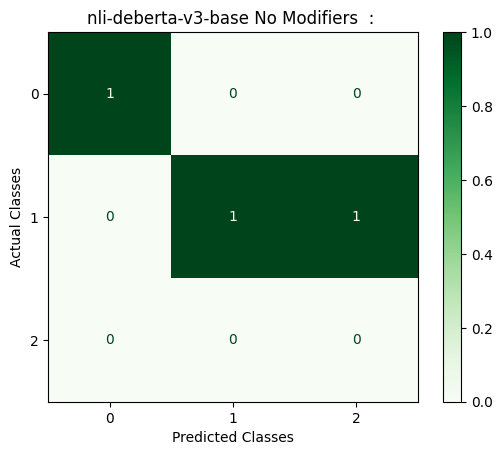

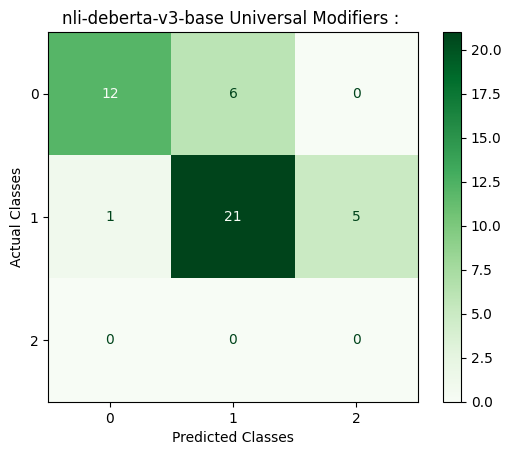

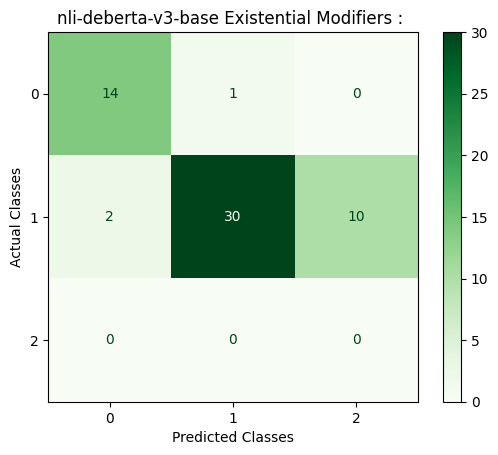

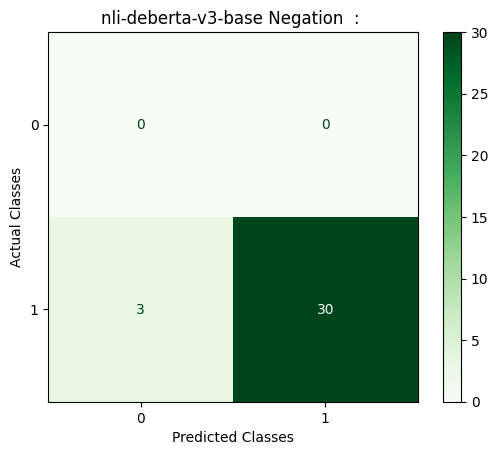

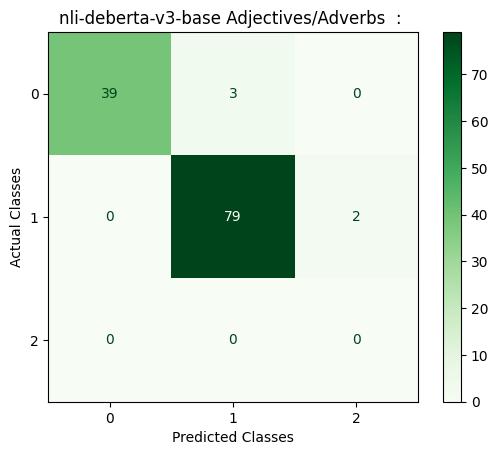

...

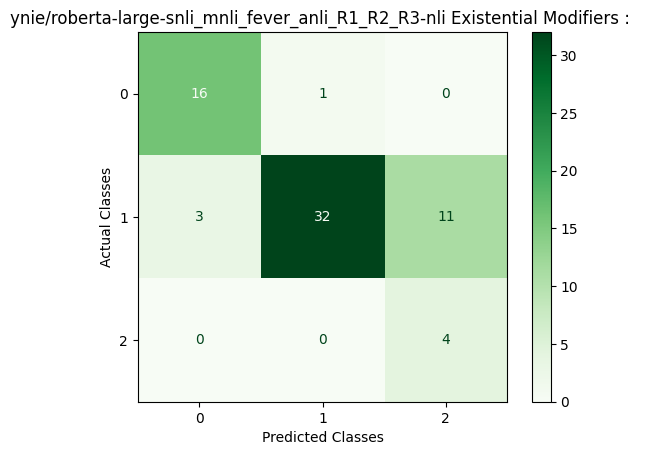

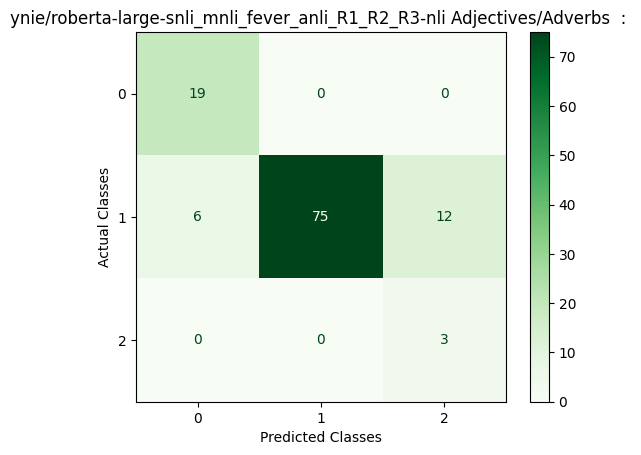

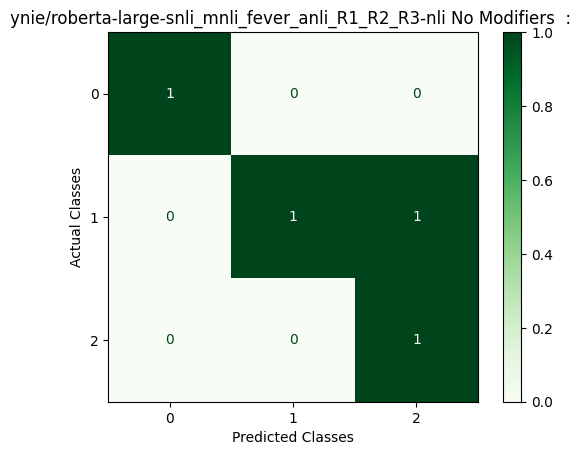

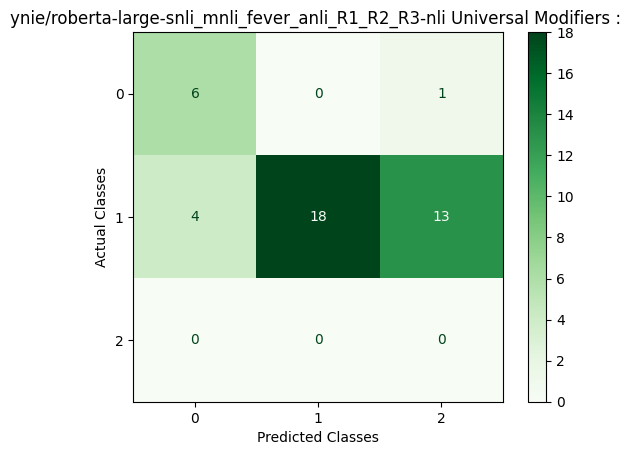

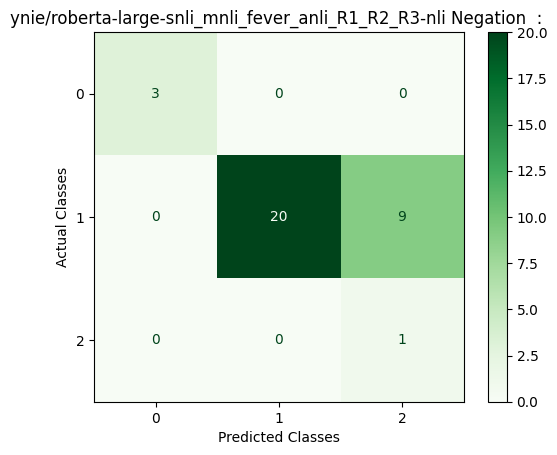

In [64]:
from pycm import *
from matplotlib import pyplot as plt

# finetuned_models_qtype_scores = []

for file in files:
  model_name = ""
  if "deberta" in os.path.basename(file):
    model_name = model_names[0]
  if "roberta" in os.path.basename(file):
    model_name = model_names[1]
  #print(files)
  print(file)

  df = pd.read_csv(file)
  df[pred] = df[pred].replace("Negation", "Contradiction")
  df[svo] = df[svo].str.lower().str.strip()
  epochs, batch_size, fold = file[-20:].split("_")[1:4]
  print(epochs, batch_size, fold )
  for q_type in df[mod_type_col].unique():
    ytrue = df[df[mod_type_col] == q_type][gt].to_list()
    print(ytrue)
    ypred = df[df[mod_type_col] == q_type][pred].to_list()

    print("This Confusion Matrix stats is for Quantifier Type %s "%(q_type))
    cm = ConfusionMatrix(actual_vector=ytrue, predict_vector=ypred)
    cm.stat(summary=True)
    #cm.print_matrix()
    cm.plot(cmap=plt.cm.Greens,number_label=True,plot_lib="matplotlib")
    this_type = "Modifiers" if q_type not in ["Adjectives/Adverbs", "No Modifiers", "Negation"] else ""
    plt.title("%s %s %s : "%(model_name,q_type, this_type))
    # filename = q_type.replace("/","_")+"_nli-deberta-v3-base"
    filename = q_type.replace("/","_")+"_"+str(epochs)+"_"+ str(batch_size)+"_"+str(fold)+"_"+os.path.basename(files[0])[:-16]
    # plt.savefig(os.path.join(os.path.join(output_path,"five-fold-cv"),filename))
    # cm.save_csv(os.path.join(os.path.join(output_path,"five-fold-cv"),filename))